In [36]:
from IPython.display import clear_output
clear_output()

from keras.applications.vgg19 import VGG19,preprocess_input
from keras.applications.xception import Xception,preprocess_input
from keras.applications import InceptionV3,inception_v3
from keras.applications import ResNet50,resnet50

In [37]:
import numpy as np 
from tqdm import tqdm
import cv2
import os
import shutil
import itertools
import imutils
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16, preprocess_input
from keras import layers
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping

init_notebook_mode(connected=True)
RANDOM_SEED = 123

splitting the dataset(yes no folders) into training and testing datasets

In [38]:
IMG_PATH = 'F:/Coding/Python_VS_Code/MRI_PROJECT/MRI_images/brain_tumor_dataset/'
# split the data by train/val/test
for CLASS in os.listdir(IMG_PATH):
    if not CLASS.startswith('.'):
        IMG_NUM = len(os.listdir(IMG_PATH + CLASS))
        for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH + CLASS)):
            img = IMG_PATH + CLASS + '/' + FILE_NAME
            if n < 5:
                shutil.copy(img, 'TEST/' + CLASS.upper() + '/' + FILE_NAME)
            elif n < 0.8*IMG_NUM:
                shutil.copy(img, 'TRAIN/'+ CLASS.upper() + '/' + FILE_NAME)
            else:
                shutil.copy(img, 'VAL/'+ CLASS.upper() + '/' + FILE_NAME)

In [39]:
# def load_data(dir_path, img_size=(100,100)):
#     """
#     Load resized images as np.arrays to workspace
#     """
#     X = []
#     y = []
#     i = 0
#     labels = dict()
#     for path in tqdm(sorted(os.listdir(dir_path))):
#         if not path.startswith('.'):
#             labels[i] = path
#             for file in os.listdir(dir_path + path):
#                 if not file.startswith('.'):
#                     img = cv2.imread(dir_path + path + '/' + file)
#                     X.append(img)
#                     y.append(i)
#             i += 1
#     X = np.array(X)
#     y = np.array(y)
#     print(f'{len(X)} images loaded from {dir_path} directory.')
#     return X, y, labels

def load_data(dir_path, img_size=(100, 100)):
    """
    Load resized images as np.arrays to workspace
    """
    X = []
    y = []
    labels = dict()
    
    for label_idx, label_name in enumerate(sorted(os.listdir(dir_path))):
        if not label_name.startswith('.'):
            labels[label_idx] = label_name
            label_path = os.path.join(dir_path, label_name)

            for file in os.listdir(label_path):
                if not file.startswith('.'):
                    img_path = os.path.join(label_path, file)
                    img = cv2.imread(img_path)

                    # Skip if unable to read image
                    if img is None:
                        print(f"Failed to read image: {img_path}. Skipping...")
                        continue

                    # Resize the image
                    img = cv2.resize(img, img_size)
                    X.append(img)
                    y.append(label_idx)

    X = np.array(X)
    y = np.array(y)
    print(f'{len(X)} images loaded from {dir_path} directory.')
    return X, y, labels

# Rest of your code...

# Example usage:
# X_train, y_train, labels_train = load_data(TRAIN_DIR, IMG_SIZE)
# X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
# X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [40]:
TRAIN_DIR = 'TRAIN/'
TEST_DIR = 'TEST/'
VAL_DIR = 'VAL/'
IMG_SIZE = (224,224)

# use predefined function to load the image data into workspace
X_train, y_train, labels = load_data(TRAIN_DIR, IMG_SIZE)
X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)

193 images loaded from TRAIN/ directory.
10 images loaded from TEST/ directory.
50 images loaded from VAL/ directory.


Let's take a look at the distribution of classes among sets:



In [41]:
y = dict()
y[0] = []
y[1] = []
for set_name in (y_train, y_val, y_test):
    y[0].append(np.sum(set_name == 0))
    y[1].append(np.sum(set_name == 1))

trace0 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[0],
    name='No',
    marker=dict(color='#33cc33'),
    opacity=0.7
)
trace1 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[1],
    name='Yes',
    marker=dict(color='#ff3300'),
    opacity=0.7
)
data = [trace0, trace1]
layout = go.Layout(
    title='Count of classes in each set',
    xaxis={'title': 'Set'},
    yaxis={'title': 'Count'}
)
fig = go.Figure(data, layout)
iplot(fig)

In [45]:
def plot_samples(X, y, labels_dict, n=50):
    """
    Creates a gridplot for desired number of images (n) from the specified set
    """
    for index in range(len(labels_dict)):
        imgs = X[np.argwhere(y == index)][:n]
        j = 10
        i = int(n/j)

        plt.figure(figsize=(15,6))
        c = 1
        for img in imgs:
            plt.subplot(i,j,c)
            plt.imshow(img[0])

            plt.xticks([])
            plt.yticks([])
            c += 1
        plt.suptitle('Tumor: {}'.format(labels_dict[index]))
        plt.show()

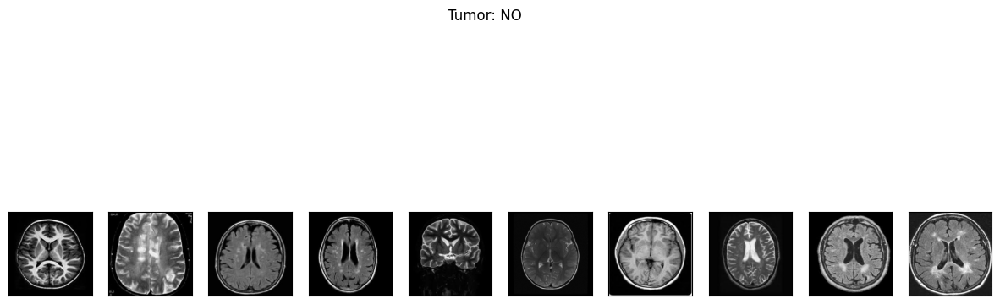

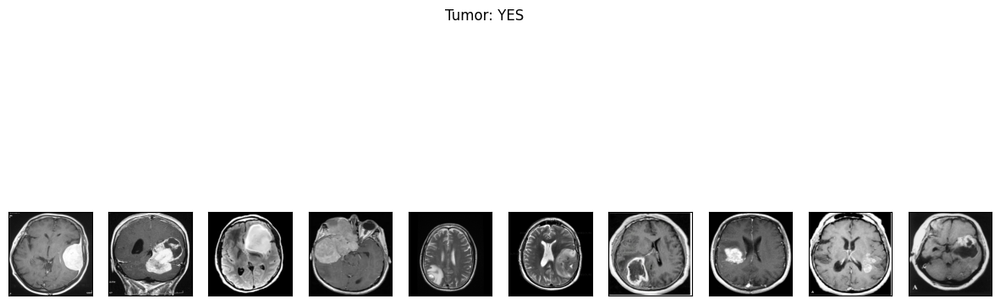

In [46]:
plot_samples(X_train, y_train, labels, 10)



As you can see, images have different width and height and diffent size of "black corners". Since the image size for VGG-16 imput layer is (224,224) some wide images may look weird after resizing. Histogram of ratio distributions (ratio = width/height):

In [ ]:
RATIO_LIST = []
for set in (X_train, X_test, X_val):
    for img in set:
        RATIO_LIST.append(img.shape[1]/img.shape[0])
        
plt.hist(RATIO_LIST)
plt.title('Distribution of Image Ratios')
plt.xlabel('Ratio Value')
plt.ylabel('Count')
plt.show()


The first step of "normalization" would be to crop the brain out of the images. I used technique which was perfectly described in pyimagesearch blog and I highly suggest to looks deeper into it.

In [56]:
# def crop_imgs(set_name, add_pixels_value=0):
#     """
#     Finds the extreme points on the image and crops the rectangular out of them
#     """
#     set_new = []
#     for img in set_name:
#         gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#         gray = cv2.GaussianBlur(gray, (5, 5), 0)

#         # threshold the image, then perform a series of erosions +
#         # dilations to remove any small regions of noise
#         thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
#         thresh = cv2.erode(thresh, None, iterations=2)
#         thresh = cv2.dilate(thresh, None, iterations=2)

#         # find contours in thresholded image, then grab the largest one
#         cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#         cnts = imutils.grab_contours(cnts)
#         c = max(cnts, key=cv2.contourArea)

#         # find the extreme points
#         extLeft = tuple(c[c[:, :, 0].argmin()][0])
#         extRight = tuple(c[c[:, :, 0].argmax()][0])
#         extTop = tuple(c[c[:, :, 1].argmin()][0])
#         extBot = tuple(c[c[:, :, 1].argmax()][0])

#         ADD_PIXELS = add_pixels_value
#         new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
#         set_new.append(new_img)

#     return np.array(set_new)

# def crop_imgs(set_name, add_pixels_value=0):
#     """
#     Finds the extreme points on the image and crops the rectangular out of them
#     """
#     set_new = []
#     for img in set_name:
#         try:
#             gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#             gray = cv2.GaussianBlur(gray, (5, 5), 0)

#             # threshold the image, then perform a series of erosions +
#             # dilations to remove any small regions of noise
#             thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
#             thresh = cv2.erode(thresh, None, iterations=2)
#             thresh = cv2.dilate(thresh, None, iterations=2)

#             # find contours in thresholded image, then grab the largest one
#             cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#             cnts = imutils.grab_contours(cnts)
#             c = max(cnts, key=cv2.contourArea)

#             # find the extreme points
#             extLeft = tuple(c[c[:, :, 0].argmin()][0])
#             extRight = tuple(c[c[:, :, 0].argmax()][0])
#             extTop = tuple(c[c[:, :, 1].argmin()][0])
#             extBot = tuple(c[c[:, :, 1].argmax()][0])

#             ADD_PIXELS = add_pixels_value
#             new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
#             set_new.append(new_img)
#         except Exception as e:
#             print(f"Error processing image: {e}. Skipping...")
#             continue

#     return np.array(set_new)

def crop_imgs(set_name, add_pixels_value=0, target_size=(224, 224)):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    set_new = []
    for img in set_name:
        try:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            gray = cv2.GaussianBlur(gray, (5, 5), 0)

            # threshold the image, then perform a series of erosions +
            # dilations to remove any small regions of noise
            thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
            thresh = cv2.erode(thresh, None, iterations=2)
            thresh = cv2.dilate(thresh, None, iterations=2)

            # find contours in thresholded image, then grab the largest one
            cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cnts = imutils.grab_contours(cnts)
            c = max(cnts, key=cv2.contourArea)

            # find the extreme points
            extLeft = tuple(c[c[:, :, 0].argmin()][0])
            extRight = tuple(c[c[:, :, 0].argmax()][0])
            extTop = tuple(c[c[:, :, 1].argmin()][0])
            extBot = tuple(c[c[:, :, 1].argmax()][0])

            ADD_PIXELS = add_pixels_value
            new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

            # Resize the cropped image to the target size
            new_img = cv2.resize(new_img, target_size)

            set_new.append(new_img)
        except Exception as e:
            print(f"Error processing image: {e}. Skipping...")
            continue

    return np.array(set_new)



In [57]:
img = cv2.imread('MRI_images/brain_tumor_dataset/yes/Y108.jpg')
img = cv2.resize(
            img,
            dsize=IMG_SIZE,
            interpolation=cv2.INTER_CUBIC
        )
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)

# threshold the image, then perform a series of erosions +
# dilations to remove any small regions of noise
thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.dilate(thresh, None, iterations=2)

# find contours in thresholded image, then grab the largest one
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

# find the extreme points
extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])

# add contour on the image
img_cnt = cv2.drawContours(img.copy(), [c], -1, (0, 255, 255), 4)

# add extreme points
img_pnt = cv2.circle(img_cnt.copy(), extLeft, 8, (0, 0, 255), -1)
img_pnt = cv2.circle(img_pnt, extRight, 8, (0, 255, 0), -1)
img_pnt = cv2.circle(img_pnt, extTop, 8, (255, 0, 0), -1)
img_pnt = cv2.circle(img_pnt, extBot, 8, (255, 255, 0), -1)

# crop
ADD_PIXELS = 0
new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

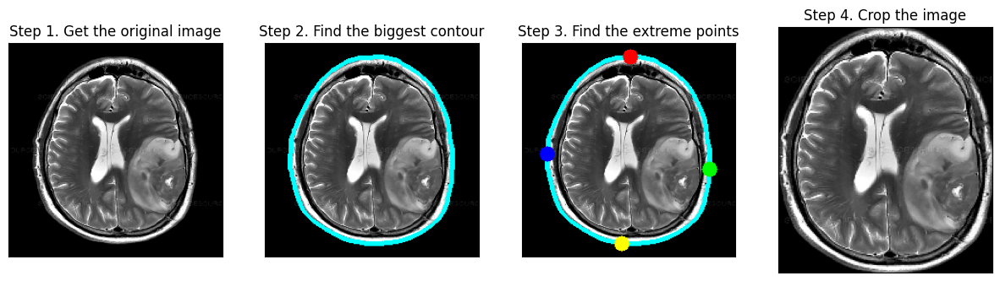

In [58]:
plt.figure(figsize=(15,6))
plt.subplot(141)
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.title('Step 1. Get the original image')
plt.subplot(142)
plt.imshow(img_cnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 2. Find the biggest contour')
plt.subplot(143)
plt.imshow(img_pnt)
plt.xticks([])
plt.yticks([])
plt.title('Step 3. Find the extreme points')
plt.subplot(144)
plt.imshow(new_img)
plt.xticks([])
plt.yticks([])
plt.title('Step 4. Crop the image')
plt.show()

In [59]:
# apply this for each set
X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

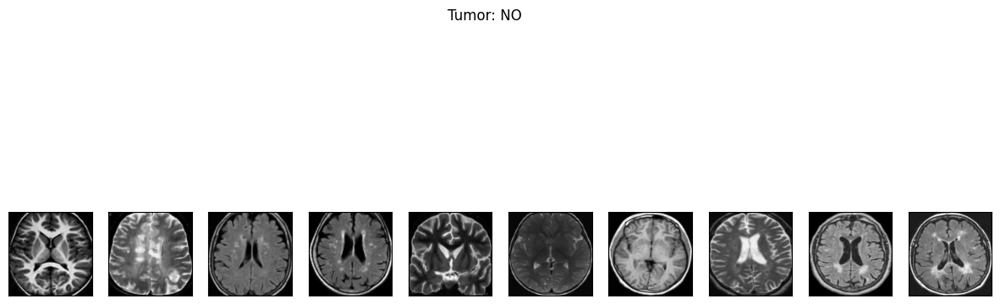

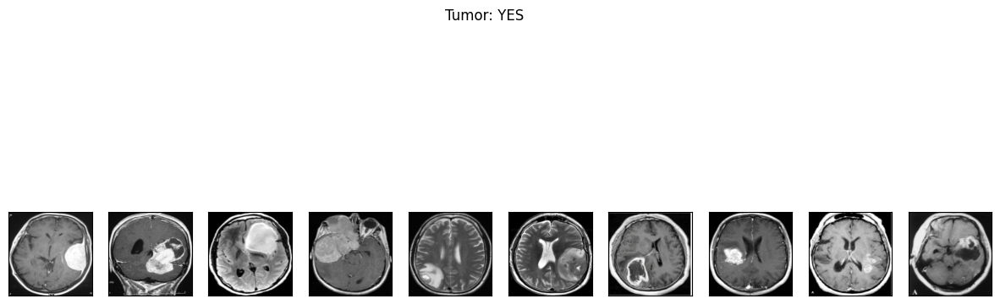

In [60]:
plot_samples(X_train_crop, y_train, labels, 10)


In [61]:
def save_new_images(x_set, y_set, folder_name):
    i = 0
    for (img, imclass) in zip(x_set, y_set):
        if imclass == 0:
            cv2.imwrite(folder_name+'NO/'+str(i)+'.jpg', img)
        else:
            cv2.imwrite(folder_name+'YES/'+str(i)+'.jpg', img)
        i += 1

In [63]:
save_new_images(X_train_crop, y_train, folder_name='TRAIN_CROP/')
save_new_images(X_val_crop, y_val, folder_name='VAL_CROP/')
save_new_images(X_test_crop, y_test, folder_name='TEST_CROP/')

The next step would be resizing images to (224,224) and applying preprocessing needed for VGG-16 model input.



In [64]:
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply VGG-15 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input(img))
    return np.array(set_new)

In [65]:
X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

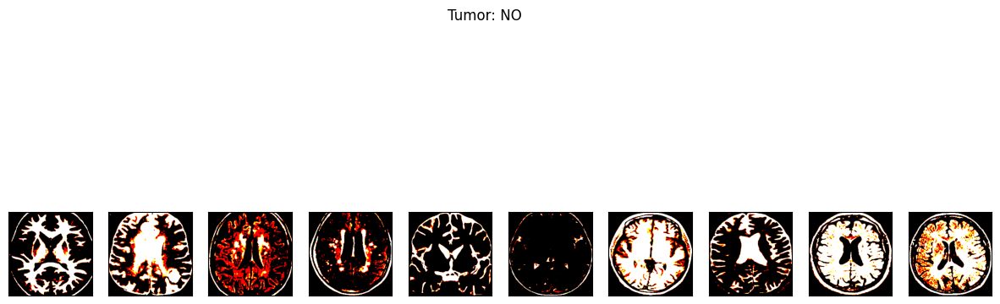

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

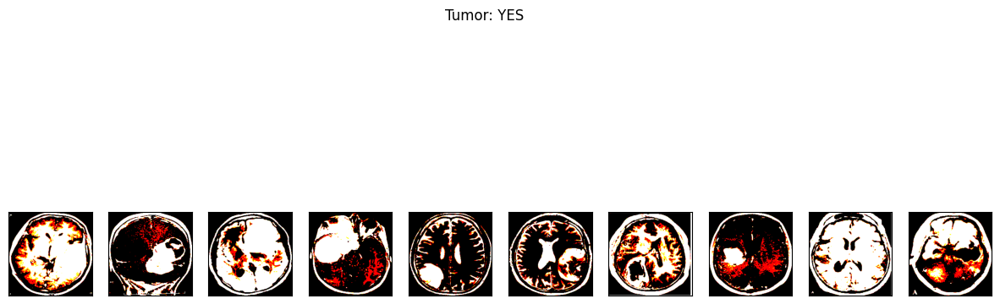

In [66]:
plot_samples(X_train_prep, y_train, labels, 10)


Data Augmentation

demo


In [68]:
# set the paramters we want to change randomly
demo_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    rescale=1./255,
    shear_range=0.05,
    brightness_range=[0.1, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

In [69]:
x = X_train_crop[0]  
x = x.reshape((1,) + x.shape) 

i = 0
for batch in demo_datagen.flow(x, batch_size=1, save_to_dir='preview', save_prefix='aug_img', save_format='jpg'):
    i += 1
    if i > 20:
        break 

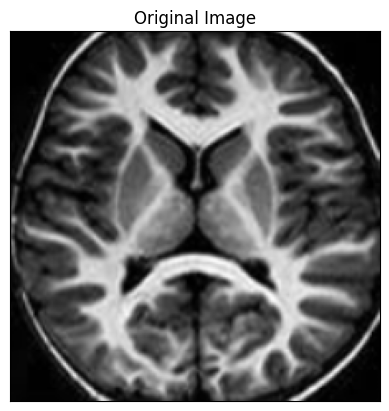

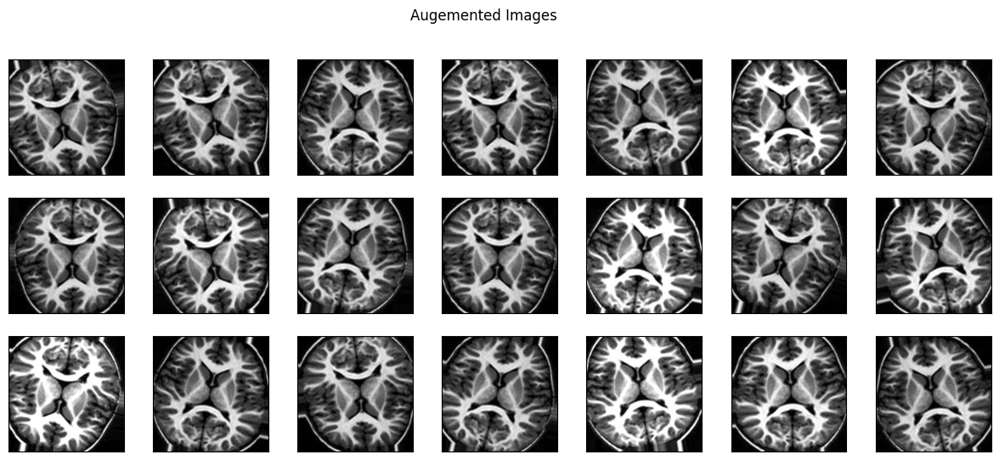

In [71]:
plt.imshow(X_train_crop[0])
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

plt.figure(figsize=(15,6))
i = 1
for img in os.listdir('preview/'):
    img = cv2.imread('preview/' + img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3,7,i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    i += 1
    if i > 3*7:
        break
plt.suptitle('Augemented Images')
plt.show()

now applying the data augmentation

In [72]:
TRAIN_DIR = 'TRAIN_CROP/'
VAL_DIR = 'VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)


train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)


validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.


applying transfer learning

In [ ]:
# # load base model
# ResNet50_weight_path = 'pretrained_transfer_learning_models/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
# resnet50_x = ResNet50(
#     weights=ResNet50_weight_path,
#     include_top=False, 
#     input_shape=IMG_SIZE + (3,)
# )

In [74]:
from keras.models import Model
from keras.layers import Input
from keras.applications import ResNet50

# Assuming IMG_SIZE is defined earlier in your code
IMG_SIZE = (224, 224)

# Load ResNet50 model with weights (excluding the problematic layers)
input_tensor = Input(shape=IMG_SIZE + (3,))
resnet50_x = ResNet50(
    include_top=False,
    weights='imagenet',
    input_tensor=input_tensor,
    pooling=None
)

94765736/94765736 [==============================] - 21s 0us/step


In [76]:
from keras.models import Model
from keras.layers import Input
from keras.applications import VGG16

# Assuming IMG_SIZE is defined earlier in your code
IMG_SIZE = (224, 224)

# Load VGG16 model with weights (excluding the problematic layers)
input_tensor = Input(shape=IMG_SIZE + (3,))
vgg = VGG16(
    include_top=False,
    weights='imagenet',
    input_tensor=input_tensor,
    pooling=None
)

In [79]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math
import cv2
import matplotlib.pyplot as plt
import os
import seaborn as sns
import umap
from PIL import Image
from scipy import misc
from os import listdir
from os.path import isfile, join
import numpy as np
from scipy import misc
from random import shuffle
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.utils import to_categorical
from keras.layers import Input

In [82]:
import os
import sys
import random
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input
from keras.layers import Dropout, Lambda
from keras.layers import Conv2D, Conv2DTranspose
from keras.layers import MaxPooling2D
from keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
import keras

VGG-16


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
Total params: 1792 (7.00 KB)
Trainable params: 1792 (7.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
1/1 [==============================] - 0s 61ms/step


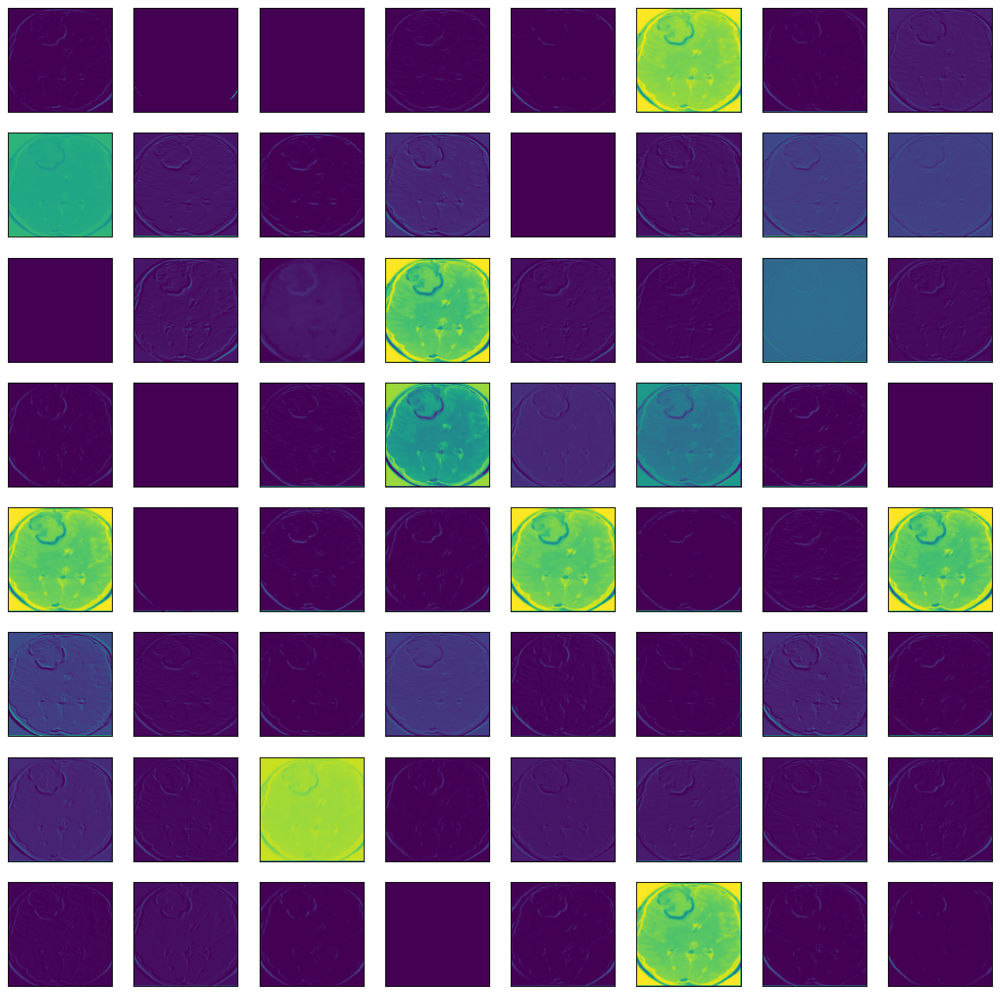

In [88]:
# plot feature map of first conv layer for given image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot 
from numpy import expand_dims


f = plt.figure(figsize=(16,16))
# load the modelf = plt.figure(figsize=(10,3))
model = VGG16()
# redefine model to output right after the first hidden layer
model = Model(inputs=model.inputs, outputs=model.layers[1].output)
model.summary()
# load the image with the required shape
# convert the image to an array
img = img_to_array(X_val_prep[43])
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
for _ in range(square):
	for _ in range(square):
		# specify subplot and turn of axis
		ax = pyplot.subplot(square, square, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		pyplot.imshow(feature_maps[0, :, :, ix-1], cmap='viridis')
		ix += 1
# show the figure
pyplot.show()

In [85]:
NUM_CLASSES = 1

vgg16 = Sequential()
vgg16.add(vgg)
vgg16.add(layers.Dropout(0.3))
vgg16.add(layers.Flatten())
vgg16.add(layers.Dropout(0.5))
vgg16.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

vgg16.layers[0].trainable = False

vgg16.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)
vgg16.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

vgg16.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 dropout_2 (Dropout)         (None, 7, 7, 512)         0         
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_3 (Dropout)         (None, 25088)             0         
                                                                 
 dense_1 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 14739777 (56.23 MB)
Trainable params: 25089 (98.00 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


1/1 [==============================] - 0s 336ms/step


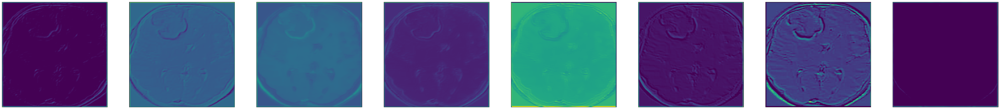

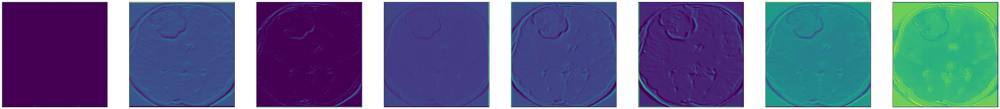

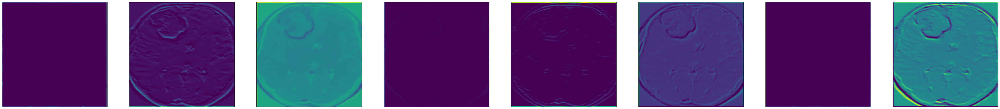

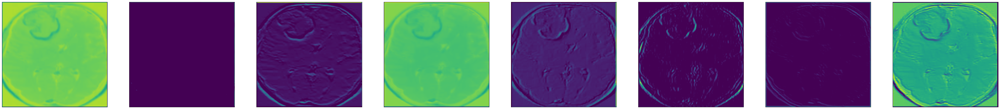

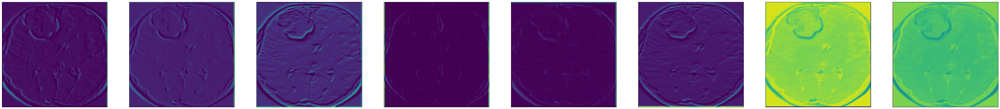

...

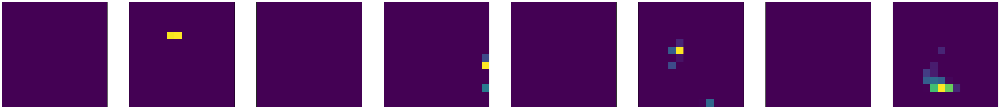

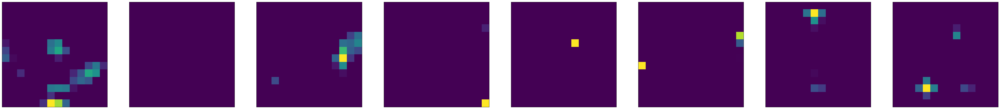

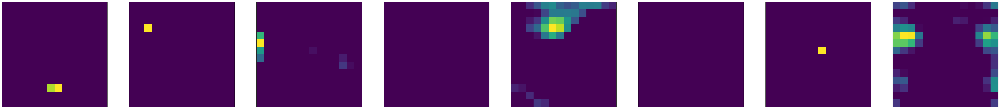

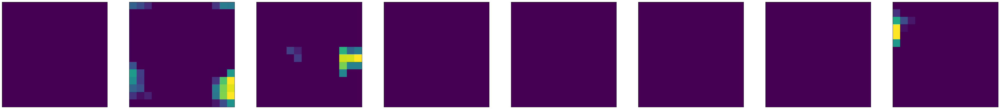

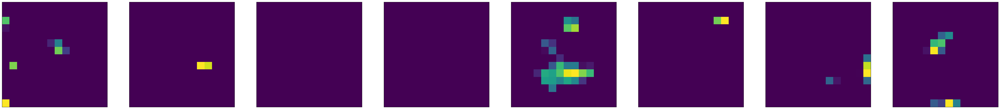

In [89]:
# visualize feature maps output from each block in the vgg model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
import matplotlib.pyplot as plt
from numpy import expand_dims




# load the model
model = VGG16()
# redefine model to output right after the first hidden layer
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
# convert the image to an array
img = img_to_array(X_val_prep[43])
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for fmap in feature_maps:
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		plt.figure(figsize=(64,64))
		for _ in range(square):
           

			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			
			# plot filter channel in grayscale
			plt.imshow(fmap[0, :, :, ix-1], cmap='viridis')
			ix += 1
	# show the figure

        
	plt.show()

In [94]:
from tensorflow.keras.optimizers import Adam

# Assuming you have already created your VGG16 model
# Example: vgg16 = create_vgg16_model()

# Compile the model
vgg16.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Now you can fit the model
vgg16_history = vgg16.fit(
    train_generator,
    epochs=120,
    validation_data=validation_generator
)

Epoch 1/120
7/7 [==============================] - 47s 7s/step - loss: 5.7354 - accuracy: 0.7254 - val_loss: 2.5914 - val_accuracy: 0.8200
Epoch 2/120
7/7 [==============================] - 52s 7s/step - loss: 5.1710 - accuracy: 0.7306 - val_loss: 3.8570 - val_accuracy: 0.7200
Epoch 3/120
7/7 [==============================] - 52s 9s/step - loss: 3.8572 - accuracy: 0.7150 - val_loss: 1.3302 - val_accuracy: 0.8800
Epoch 4/120
7/7 [==============================] - 52s 7s/step - loss: 4.7644 - accuracy: 0.7358 - val_loss: 1.0731 - val_accuracy: 0.8600
Epoch 5/120
7/7 [==============================] - 52s 7s/step - loss: 3.4211 - accuracy: 0.7720 - val_loss: 1.2976 - val_accuracy: 0.8000
Epoch 6/120
7/7 [==============================] - 52s 7s/step - loss: 3.6848 - accuracy: 0.7772 - val_loss: 1.6328 - val_accuracy: 0.8000
Epoch 7/120
7/7 [==============================] - 52s 7s/step - loss: 3.6196 - accuracy: 0.7513 - val_loss: 0.7637 - val_accuracy: 0.8800
Epoch 8/120
7/7 [==========

In [112]:
# validate on val set
predictions = vgg16.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

_, train_acc = vgg16.evaluate(X_val_prep, y_val, verbose=0)
_, test_acc = vgg16.evaluate(X_test_prep, y_test, verbose=0)

1/1 [==============================] - 2s 2s/step


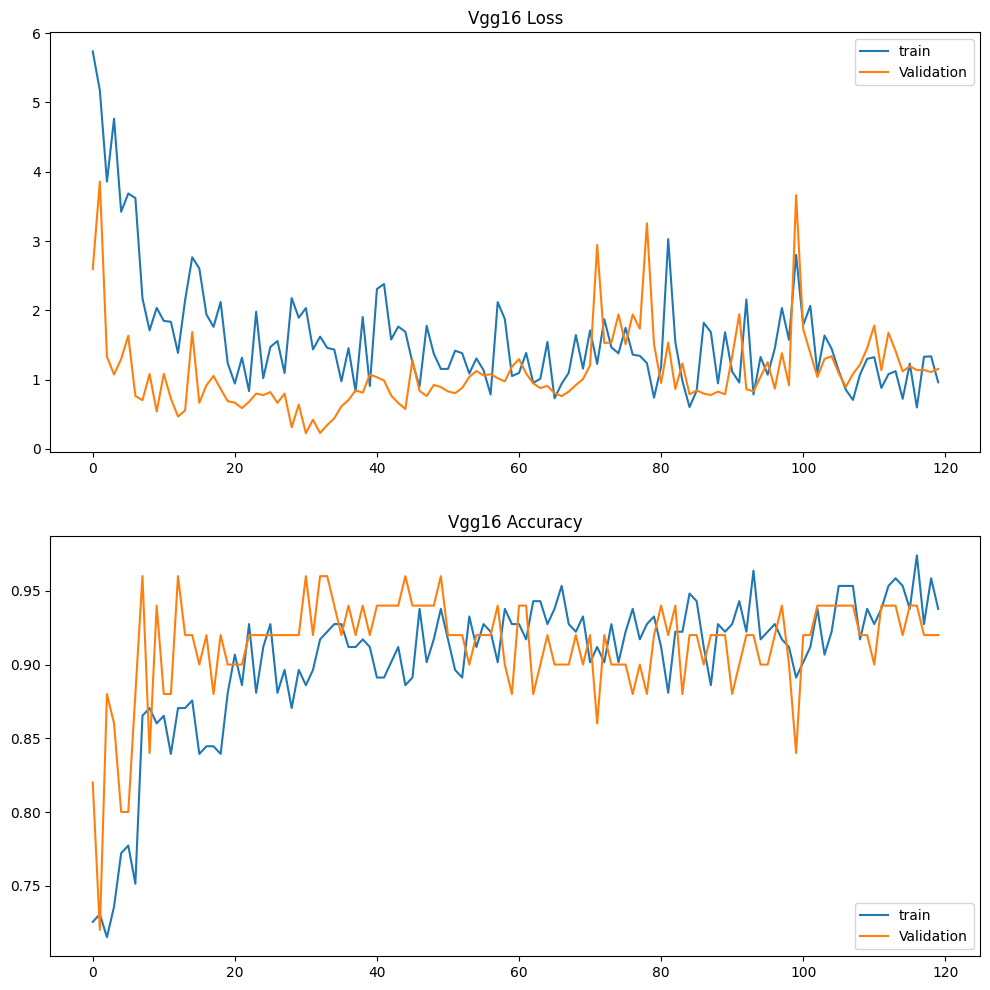

In [98]:
pyplot.figure(figsize=(12,12))
# plot loss during training
pyplot.subplot(211)
pyplot.title('Vgg16 Loss')
pyplot.plot(vgg16_history.history['loss'], label='train')
pyplot.plot(vgg16_history.history['val_loss'], label='Validation')
pyplot.legend()
# plot accuracy during training
pyplot.subplot(212)
pyplot.title('Vgg16 Accuracy')
pyplot.plot(vgg16_history.history['accuracy'], label='train')
pyplot.plot(vgg16_history.history['val_accuracy'], label='Validation')
pyplot.legend()
pyplot.show()

In [99]:
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))


Train: 0.920, Test: 1.000


In [100]:
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from keras.models import Sequential
from keras.layers import Dense

# accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test, predictions)
print('Accuracy: %f' % accuracy)
# precision tp / (tp + fp)
precision = precision_score(y_test, predictions)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, predictions)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, predictions)
print('F1 score: %f' % f1)

Accuracy: 1.000000
Precision: 1.000000
Recall: 1.000000
F1 score: 1.000000


In [101]:
kappa = cohen_kappa_score(y_test, predictions)
print('Cohens kappa: %f' % kappa)
# ROC AUC
auc = roc_auc_score(y_test, predictions)
print('ROC AUC: %f' % auc)
# confusion matrix
matrix = confusion_matrix(y_test, predictions)
print(matrix)

Cohens kappa: 1.000000
ROC AUC: 1.000000
[[5 0]
 [0 5]]


In [114]:
# save the model
vgg16.save('trained_VGG_model.h5')

In [115]:
import keras

In [116]:
model = keras.models.load_model('trained_VGG_model.h5')


In [117]:
# validate on val set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

_, train_acc = model.evaluate(X_val_prep, y_val, verbose=0)
_, test_acc = model.evaluate(X_test_prep, y_test, verbose=0)

1/1 [==============================] - 2s 2s/step


RESNET50


In [119]:
NUM_CLASSES = 1

resnet50 = Sequential()
resnet50.add(resnet50_x)
resnet50.add(layers.Dropout(0.3))
resnet50.add(layers.Flatten())
resnet50.add(layers.Dropout(0.5))
resnet50.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

resnet50.layers[0].trainable = False

resnet50.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)
# resnet50.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.0003, beta_1=0.9, beta_2=0.999, epsilon=None, amsgrad=False), metrics=["accuracy"])
resnet50.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

resnet50.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 2048)        0         
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dropout_5 (Dropout)         (None, 100352)            0         
                                                                 
 dense_2 (Dense)             (None, 1)                 100353    
                                                                 
Total params: 23688065 (90.36 MB)
Trainable params: 100353 (392.00 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [120]:
from tensorflow.keras.optimizers import Adam

# Assuming you have already created your VGG16 model
# Example: vgg16 = create_vgg16_model()

# Compile the model
resnet50.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Now you can fit the model
resnet50_history = resnet50.fit(
    train_generator,
    epochs=60,
    validation_data=validation_generator
)

Epoch 1/60
7/7 [==============================] - 22s 3s/step - loss: 6.2135 - accuracy: 0.4870 - val_loss: 2.2489 - val_accuracy: 0.8000
Epoch 2/60
7/7 [==============================] - 20s 3s/step - loss: 5.5323 - accuracy: 0.6736 - val_loss: 0.4257 - val_accuracy: 0.9000
Epoch 3/60
7/7 [==============================] - 21s 4s/step - loss: 2.6139 - accuracy: 0.7461 - val_loss: 0.1380 - val_accuracy: 0.9800
Epoch 4/60
7/7 [==============================] - 21s 3s/step - loss: 1.1215 - accuracy: 0.8549 - val_loss: 0.4670 - val_accuracy: 0.9000
Epoch 5/60
7/7 [==============================] - 21s 3s/step - loss: 1.0779 - accuracy: 0.8497 - val_loss: 0.1817 - val_accuracy: 0.9400
Epoch 6/60
7/7 [==============================] - 22s 3s/step - loss: 1.0783 - accuracy: 0.8549 - val_loss: 0.3233 - val_accuracy: 0.9000
Epoch 7/60
7/7 [==============================] - 21s 3s/step - loss: 0.5980 - accuracy: 0.9119 - val_loss: 0.0297 - val_accuracy: 0.9800
Epoch 8/60
7/7 [==================

In [121]:
# validate on val set
predictions_RESNET = resnet50.predict(X_test_prep)
predictions_RESNET = [1 if x>0.5 else 0 for x in predictions]

_, train_acc_RESNET = resnet50.evaluate(X_val_prep, y_val, verbose=0)
_, test_acc_RESNET = resnet50.evaluate(X_test_prep, y_test, verbose=0)

1/1 [==============================] - 2s 2s/step


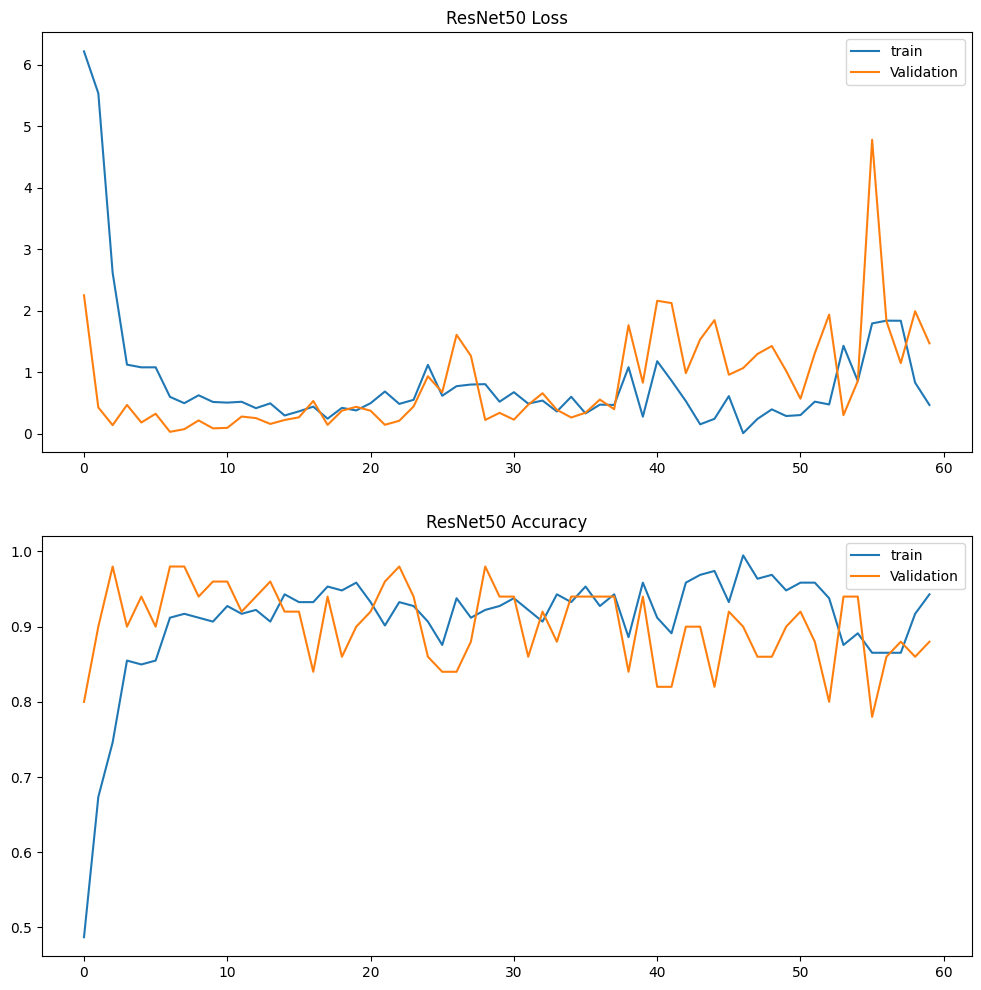

In [122]:
pyplot.figure(figsize=(12,12))
# plot loss during training
pyplot.subplot(211)
pyplot.title('ResNet50 Loss')
pyplot.plot(resnet50_history.history['loss'], label='train')
pyplot.plot(resnet50_history.history['val_loss'], label='Validation')
pyplot.legend()
# plot accuracy during training
pyplot.subplot(212)
pyplot.title('ResNet50 Accuracy')
pyplot.plot(resnet50_history.history['accuracy'], label='train')
pyplot.plot(resnet50_history.history['val_accuracy'], label='Validation')
pyplot.legend()
pyplot.show()

In [124]:
print('Train: %.3f, Test: %.3f' % (train_acc_RESNET, test_acc_RESNET))


Train: 0.900, Test: 0.900


In [125]:
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from keras.models import Sequential
from keras.layers import Dense

# accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test, predictions_RESNET)
print('Accuracy: %f' % accuracy)
# precision tp / (tp + fp)
precision = precision_score(y_test, predictions_RESNET)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, predictions_RESNET)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, predictions_RESNET)
print('F1 score: %f' % f1)

Accuracy: 1.000000
Precision: 1.000000
Recall: 1.000000
F1 score: 1.000000


In [126]:
kappa = cohen_kappa_score(y_test, predictions_RESNET)
print('Cohens kappa: %f' % kappa)
# ROC AUC
auc = roc_auc_score(y_test, predictions_RESNET)
print('ROC AUC: %f' % auc)
# confusion matrix
matrix = confusion_matrix(y_test, predictions_RESNET)
print(matrix)

Cohens kappa: 1.000000
ROC AUC: 1.000000
[[5 0]
 [0 5]]


Google's Teachable Machine

In [1]:
from keras.models import load_model  # TensorFlow is required for Keras to work
from PIL import Image, ImageOps  # Install pillow instead of PIL
import numpy as np

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
teachable = load_model("teachable_machine_trained/teachable.h5", compile=False)

# Load the labels
class_names = open("teachable_machine_trained/labels.txt", "r").readlines()

In [2]:
data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)

# Replace this with the path to your image
image = Image.open("TEST/NO/12 no.jpg").convert("RGB")

# resizing the image to be at least 224x224 and then cropping from the center
size = (224, 224)
image = ImageOps.fit(image, size, Image.Resampling.LANCZOS)

# turn the image into a numpy array
image_array = np.asarray(image)

# Normalize the image
normalized_image_array = (image_array.astype(np.float32) / 127.5) - 1

# Load the image into the array
data[0] = normalized_image_array

# Predicts the model
prediction = teachable.predict(data)
index = np.argmax(prediction)
class_name = class_names[index]
confidence_score = prediction[0][index]

# Print prediction and confidence score
print("Class:", class_name[2:], end="")
print("Confidence Score:", confidence_score)

1/1 [==============================] - 1s 1s/step
Class: no
Confidence Score: 0.999757


DenseNet

In [154]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model and add the base model
model = Sequential()
model.add(base_model)

# Add a global average pooling layer
model.add(GlobalAveragePooling2D())

# Add a dense layer for binary classification
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()


74836368/74836368 [==============================] - 16s 0us/step
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d (  (None, 1920)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_9 (Dense)             (None, 1)                 1921      
                                                                 
Total params: 18323905 (69.90 MB)
Trainable params: 1921 (7.50 KB)
Non-trainable params: 18321984 (69.89 MB)
_________________________________________________________________


In [159]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# Assuming you have a DenseNet model (replace this with your actual DenseNet import)
from tensorflow.keras.applications import DenseNet201

# Create the base model (DenseNet without top layers)
densenet_x = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model
densenet = Sequential()

# Add the pre-trained base model
densenet.add(densenet_x)

# Add a global average pooling layer
densenet.add(GlobalAveragePooling2D())

# Add a dense layer for binary classification
densenet.add(Dense(1, activation='sigmoid'))

# Compile the model
densenet.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
densenet.summary()

# Assuming your training and validation generators are already defined
# train_generator and validation_generator



Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d_2  (None, 1920)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_11 (Dense)            (None, 1)                 1921      
                                                                 
Total params: 18323905 (69.90 MB)
Trainable params: 18094849 (69.03 MB)
Non-trainable params: 229056 (894.75 KB)
_________________________________________________________________


In [161]:
# Now you can fit the model
densenet_history = model.fit(
    train_generator,
    epochs=60,
    validation_data=validation_generator
)


Epoch 1/60
7/7 [==============================] - 31s 5s/step - loss: 0.5834 - accuracy: 0.6891 - val_loss: 0.5987 - val_accuracy: 0.6800
Epoch 2/60
7/7 [==============================] - 33s 5s/step - loss: 0.6093 - accuracy: 0.7306 - val_loss: 0.5531 - val_accuracy: 0.7000
Epoch 3/60
7/7 [==============================] - 33s 5s/step - loss: 0.6004 - accuracy: 0.7202 - val_loss: 0.6237 - val_accuracy: 0.7200
Epoch 4/60
7/7 [==============================] - 33s 5s/step - loss: 0.8516 - accuracy: 0.6891 - val_loss: 0.5378 - val_accuracy: 0.7400
Epoch 5/60
7/7 [==============================] - 33s 5s/step - loss: 1.2539 - accuracy: 0.4508 - val_loss: 0.5542 - val_accuracy: 0.7400
Epoch 6/60
7/7 [==============================] - 33s 5s/step - loss: 0.8317 - accuracy: 0.6321 - val_loss: 1.1847 - val_accuracy: 0.6200
Epoch 7/60
7/7 [==============================] - 33s 5s/step - loss: 0.7712 - accuracy: 0.6995 - val_loss: 0.5533 - val_accuracy: 0.7000
Epoch 8/60
7/7 [==================

In [162]:
# validate on val set
predictions_DENSENET = model.predict(X_test_prep)
predictions_DENSENET = [1 if x>0.5 else 0 for x in predictions_DENSENET]

_, train_acc_DENSENET = model.evaluate(X_val_prep, y_val, verbose=0)
_, test_acc_DENSENET = model.evaluate(X_test_prep, y_test, verbose=0)

1/1 [==============================] - 5s 5s/step


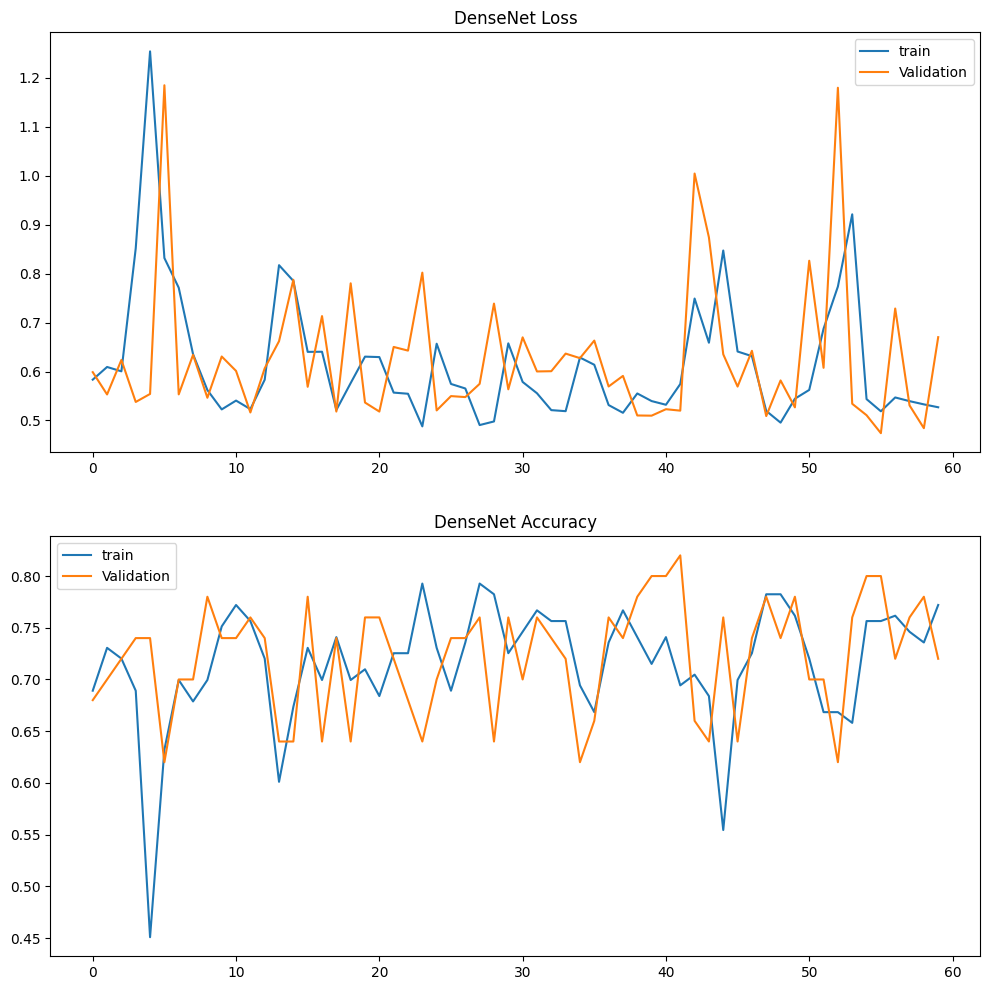

In [163]:
pyplot.figure(figsize=(12,12))
# plot loss during training
pyplot.subplot(211)
pyplot.title('DenseNet Loss')
pyplot.plot(densenet_history.history['loss'], label='train')
pyplot.plot(densenet_history.history['val_loss'], label='Validation')
pyplot.legend()
# plot accuracy during training
pyplot.subplot(212)
pyplot.title('DenseNet Accuracy')
pyplot.plot(densenet_history.history['accuracy'], label='train')
pyplot.plot(densenet_history.history['val_accuracy'], label='Validation')
pyplot.legend()
pyplot.show()

In [164]:
print('Train: %.3f, Test: %.3f' % (train_acc_DENSENET, test_acc_DENSENET))


Train: 0.720, Test: 0.600


In [165]:
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from keras.models import Sequential
from keras.layers import Dense

# accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test, predictions_DENSENET)
print('Accuracy: %f' % accuracy)
# precision tp / (tp + fp)
precision = precision_score(y_test, predictions_DENSENET)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, predictions_DENSENET)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, predictions_DENSENET)
print('F1 score: %f' % f1)

Accuracy: 0.600000
Precision: 0.555556
Recall: 1.000000
F1 score: 0.714286


In [166]:
kappa = cohen_kappa_score(y_test, predictions_DENSENET)
print('Cohens kappa: %f' % kappa)
# ROC AUC
auc = roc_auc_score(y_test, predictions_DENSENET)
print('ROC AUC: %f' % auc)
# confusion matrix
matrix = confusion_matrix(y_test, predictions_DENSENET)
print(matrix)

Cohens kappa: 0.200000
ROC AUC: 0.600000
[[1 4]
 [0 5]]


In [167]:
model.save('trained_DENSENET_model.h5')

c:\Users\Soumyajit\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

